In [1]:
##1. import libraries

In [1]:

import pandas as pd 
import numpy as np 
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt 
import os
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, plot_confusion_matrix, classification_report
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
##2. read and  process data

In [3]:
df = pd.read_excel('default of credit card clients.xls', header=1)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   ID                          30000 non-null  int64
 1   LIMIT_BAL                   30000 non-null  int64
 2   SEX                         30000 non-null  int64
 3   EDUCATION                   30000 non-null  int64
 4   MARRIAGE                    30000 non-null  int64
 5   AGE                         30000 non-null  int64
 6   PAY_0                       30000 non-null  int64
 7   PAY_2                       30000 non-null  int64
 8   PAY_3                       30000 non-null  int64
 9   PAY_4                       30000 non-null  int64
 10  PAY_5                       30000 non-null  int64
 11  PAY_6                       30000 non-null  int64
 12  BILL_AMT1                   30000 non-null  int64
 13  BILL_AMT2                   30000 non-null  int64
 14  BILL_A

In [5]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [6]:
df.drop(columns=['ID'], inplace=True)
df.rename(columns={'PAY_0':'PAY_1'}, inplace=True)

In [7]:
#no missing values
df.isna().sum().sum()

0

In [8]:
df.describe()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,-0.266200,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,1.133187,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


In [ ]:
#values of EDUCATION are different from data description (1 = graduate school; 2 = university; 3 = high school; 4 = others).
#group values 5, 6, 0 to 4 (others)
df.replace({'EDUCATION': {5: 4, 6: 4, 0: 4}}, inplace=True)
#similar to MARRIAGE var: (1 = married; 2 = single; 3 = others)
df.replace({'MARRIAGE': {0: 3}}, inplace=True)

In [9]:
#one hot encoding for sex, education, marriage and pay
df = pd.get_dummies(df, prefix=['SEX', 'EDU', 'MARRIAGE', 'PAY_1', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6'], columns=['SEX', 'EDUCATION', 'MARRIAGE', 'PAY_1', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6'])

In [10]:
#train_test_split
df_X = df.drop(['default payment next month'], axis=1)
df_y = df[['default payment next month']]

X_train, X_test, y_train, y_test = train_test_split(df_X, df_y, test_size=0.2, random_state=10)


In [11]:
df_X.columns

Index(['LIMIT_BAL', 'AGE', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4',
       'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3',
       'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'SEX_1', 'SEX_2', 'EDU_0', 'EDU_1',
       'EDU_2', 'EDU_3', 'EDU_4', 'EDU_5', 'EDU_6', 'MARRIAGE_0', 'MARRIAGE_1',
       'MARRIAGE_2', 'MARRIAGE_3', 'PAY_1_-2', 'PAY_1_-1', 'PAY_1_0',
       'PAY_1_1', 'PAY_1_2', 'PAY_1_3', 'PAY_1_4', 'PAY_1_5', 'PAY_1_6',
       'PAY_1_7', 'PAY_1_8', 'PAY_2_-2', 'PAY_2_-1', 'PAY_2_0', 'PAY_2_1',
       'PAY_2_2', 'PAY_2_3', 'PAY_2_4', 'PAY_2_5', 'PAY_2_6', 'PAY_2_7',
       'PAY_2_8', 'PAY_3_-2', 'PAY_3_-1', 'PAY_3_0', 'PAY_3_1', 'PAY_3_2',
       'PAY_3_3', 'PAY_3_4', 'PAY_3_5', 'PAY_3_6', 'PAY_3_7', 'PAY_3_8',
       'PAY_4_-2', 'PAY_4_-1', 'PAY_4_0', 'PAY_4_1', 'PAY_4_2', 'PAY_4_3',
       'PAY_4_4', 'PAY_4_5', 'PAY_4_6', 'PAY_4_7', 'PAY_4_8', 'PAY_5_-2',
       'PAY_5_-1', 'PAY_5_0', 'PAY_5_2', 'PAY_5_3', 'PAY_5_4', 'PAY_5_5',
       'PAY_5_6', 'PAY_5_7', 'P

In [12]:
col_to_scale = ['LIMIT_BAL', 'AGE', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4',
       'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3',
       'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']

In [13]:
#standardize features 
from sklearn import preprocessing
std_scaler = preprocessing.StandardScaler()
X_train[col_to_scale] = std_scaler.fit_transform(X_train[col_to_scale])
X_test[col_to_scale] = std_scaler.transform(X_test[col_to_scale])

In [15]:
##3. SVM

In [16]:
from sklearn.svm import SVC
# find best parameters for training data
params={
        'C': np.arange(0.5,1.5,0.1),
        'gamma': [0.001, 0.01, 0.1, 1],
        }
                
model_svm = GridSearchCV(SVC(), params,cv=5,scoring='accuracy', verbose=100)
model_svm.fit(X_train, y_train)
print(model_svm.best_score_)
print(model_svm.best_params_)

; 16/40] END C=0.7999999999999999, gamma=1;, score=0.791 total time= 1.2min
[CV 1/5; 17/40] START C=0.8999999999999999, gamma=0.001.........................
[CV 1/5; 17/40] END C=0.8999999999999999, gamma=0.001;, score=0.820 total time=  19.7s
[CV 2/5; 17/40] START C=0.8999999999999999, gamma=0.001.........................
[CV 2/5; 17/40] END C=0.8999999999999999, gamma=0.001;, score=0.818 total time=  19.7s
[CV 3/5; 17/40] START C=0.8999999999999999, gamma=0.001.........................
[CV 3/5; 17/40] END C=0.8999999999999999, gamma=0.001;, score=0.813 total time=  19.5s
[CV 4/5; 17/40] START C=0.8999999999999999, gamma=0.001.........................
[CV 4/5; 17/40] END C=0.8999999999999999, gamma=0.001;, score=0.818 total time=  19.6s
[CV 5/5; 17/40] START C=0.8999999999999999, gamma=0.001.........................
[CV 5/5; 17/40] END C=0.8999999999999999, gamma=0.001;, score=0.812 total time=  19.7s
[CV 1/5; 18/40] START C=0.8999999999999999, gamma=0.01..........................
[CV

In [17]:
# predict testing data from model with the best parameters
y_pred= model_svm.predict(X_test)

In [18]:
print('\nConfusion matrix for SVM:\n ', confusion_matrix(y_pred, y_test))
print('\nAccuracy Score for SVM: ', accuracy_score(y_pred,y_test))


Confusion matrix for SVM:
  [[4493  878]
 [ 190  439]]

Accuracy Score for SVM:  0.822


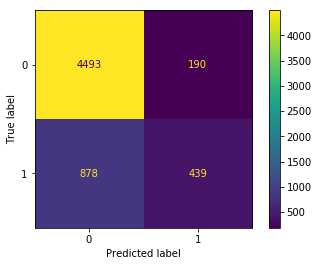

In [19]:
#draw confusion matrix
plot_confusion_matrix(model_svm, X_test, y_test)

In [14]:
##4. Logistic regression
from sklearn.linear_model import LogisticRegression

log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)

y_pred = log_reg.predict(X_test)

print('\nConfusion matrix for Logistic Regression:\n ', confusion_matrix(y_pred, y_test))
print('\nAccuracy Score for Logistic Regression: ', accuracy_score(y_pred,y_test))



Confusion matrix for Logistic Regression:
  [[4476  850]
 [ 207  467]]

Accuracy Score for Logistic Regression:  0.8238333333333333


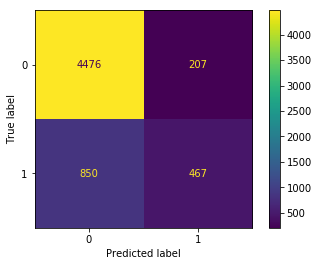

In [15]:
plot_confusion_matrix(log_reg, X_test, y_test)

Text(0.5, 1.0, 'scree plot')

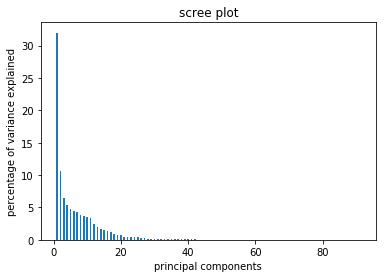

In [22]:
##5. PCA
from sklearn.decomposition import PCA
pca = PCA()
X_train_pca = pca.fit(X_train)
#draw scree plot with all PCA
per_var = np.round(pca.explained_variance_ratio_* 100, decimals =1)
labels = [str(x) for x in range(1,len(per_var)+1)]
plt.bar(x = range(1,len(per_var)+1), height= per_var, width=0.5)
plt.ylabel('percentage of variance explained')
plt.xlabel('principal components')
plt.title('scree plot')

In [23]:
# visual training data with 2 principle components
import seaborn as sns

In [24]:
pca = PCA(n_components=2)
X_train_pca2 = pca.fit_transform(X_train)
pca_pred=pd.DataFrame(X_train_pca2)
pca_pred = pd.concat([pca_pred, y_train], axis=1)
pca_pred.head()

,0,1,default payment next month
0,-0.738719,-1.403695,1.0
1,-1.276106,1.971716,1.0
2,-1.765489,-0.158662,0.0
3,1.399967,2.521298,0.0
4,1.263650,-0.048670,0.0


Text(0, 0.5, 'Principal 2 - Explains 10.6 % of the variance')

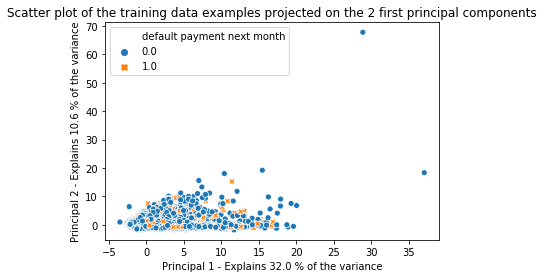

In [25]:
sns.scatterplot(pca_pred[0], pca_pred[1], data=pca_pred, hue='default payment next month', style='default payment next month')
plt.title(
    "Scatter plot of the training data examples projected on the "
    "2 first principal components")
plt.xlabel("Principal 1 - Explains %.1f %% of the variance" % (
    pca.explained_variance_ratio_[0] * 100.0))
plt.ylabel("Principal 2 - Explains %.1f %% of the variance" % (
    pca.explained_variance_ratio_[1] * 100.0))
